In [1]:
# import the Necessary tools
import tensorflow_hub as hub
import tensorflow as tf
print("TF hub version :",hub.__version__)
print("TF version:",tf.__version__)

# Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU")else "not available")

TF hub version : 0.13.0
TF version: 2.12.0
GPU available


In [2]:
# Checkout the labels of our data  
import pandas as pd
# Run this cell and select the kaggle.json file downloaded
# from the Kaggle account settings page.
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"chanchan20","key":"7bd1dc7c2a19f66f38931cbc6e60b532"}'}

In [3]:
# Next, install the Kaggle API client.
!pip install -q kaggle

In [4]:
# The Kaggle API client exprects this file to be in ~/.kaggle, so move it there.
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

# This permissions change avoids a warning on kaggle tool startup.
!chmod 600 ~/.kaggle/Kaggle.json

chmod: cannot access '/root/.kaggle/Kaggle.json': No such file or directory


In [5]:
#Creating directory and changing the current working directory
!mkdir dog_dataset
%cd dog_dataset

/content/dog_dataset


In [6]:
# Searching for dataset
!kaggle datasets list -s dogbreedidfromcomp

ref                                title                    size  lastUpdated          downloadCount  voteCount  usabilityRating  
---------------------------------  ----------------------  -----  -------------------  -------------  ---------  ---------------  
catherinehorng/dogbreedidfromcomp  dog-breed-id-from-comp  691MB  2020-06-26 03:09:05           3517          7  0.1764706        


In [7]:
# Downloading dataset and coming out of directory 
!kaggle datasets download catherinehorng/dogbreedidfromcomp
%cd ..

100% 689M/691M [00:06<00:00, 155MB/s]
100% 691M/691M [00:06<00:00, 117MB/s]
/content


In [8]:
# Unzipping downloaded file and removing unusable file
!unzip dog_dataset/dogbreedidfromcomp.zip -d dog_dataset
!rm dog_dataset/dogbreedidfromcomp.zip
!rm dog_dataset/sample_submission.csv

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: dog_dataset/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: dog_dataset/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: dog_dataset/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: dog_dataset/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: dog_dataset/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: dog_dataset/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: dog_dataset/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: dog_dataset/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: dog_dataset/train/83fad0718581a696132c96c166472627.jpg  
  inflating: dog_dataset/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: dog_dataset/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: dog_dataset/train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: dog_dataset/train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating:

In [9]:
# Checkout the labels of our data  
import pandas as pd
labels_csv = pd.read_csv("dog_dataset/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [10]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

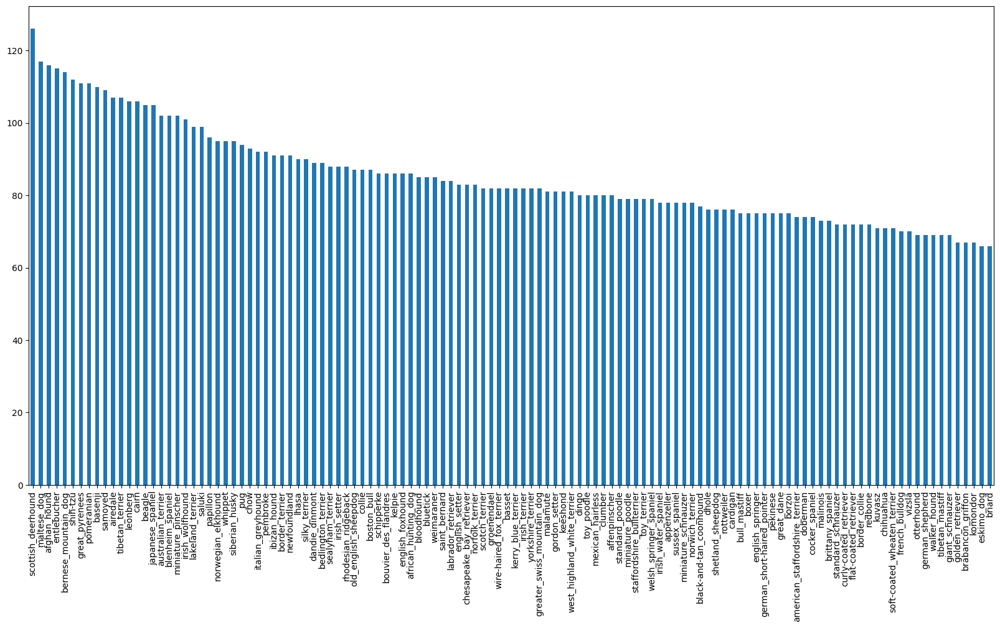

In [11]:
# How many are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [12]:
labels_csv["breed"].value_counts().median()

82.0

In [13]:
# !pip install ipython
# import IPython

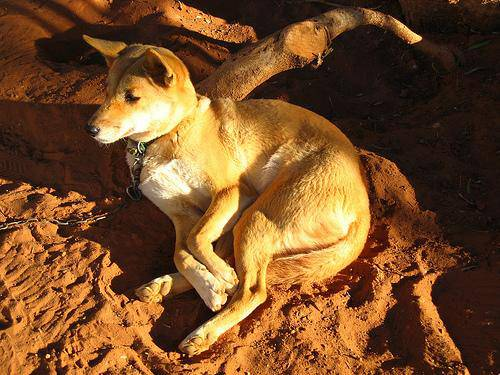

In [14]:
# Let's view an image
from IPython.display import display,Image
Image("dog_dataset/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [15]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [16]:
# Create pathnames from image ID's
filenames = ['dog_dataset/train/'+fname+'.jpg' for fname in labels_csv['id']]

filenames[:10] # First 10

['dog_dataset/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'dog_dataset/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'dog_dataset/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'dog_dataset/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'dog_dataset/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'dog_dataset/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'dog_dataset/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'dog_dataset/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'dog_dataset/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'dog_dataset/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [17]:
# Check whether number of file names matches number of actual image files
import os 
if len(os.listdir("dog_dataset/train/"))== len(filenames):
  print("proceed!!!")
else:
  print("error occured!!!")  

proceed!!!


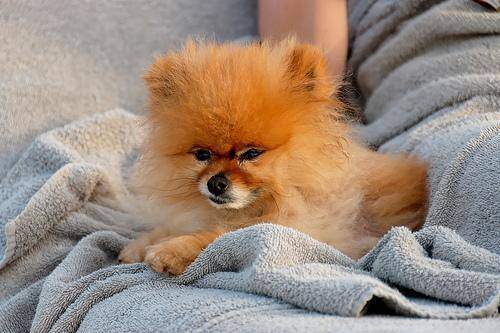

In [18]:
#one more check
Image(filenames[8000])

In [19]:
labels_csv["breed"][8000]

'pomeranian'

In [20]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
#labels= np.array(labels) # does same thing as above command
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [21]:
len(labels)

10222

In [22]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("number of labels matches number of filenames !")
else:
  print("number of labels does not match number of filenames,check data dictionaries !")  

number of labels matches number of filenames !


In [23]:
# Find the unique labels values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [24]:
unique_breeds
textfile = open("breeds.txt", "w")
for element in unique_breeds:
    textfile.write(element + "\n")
textfile.close()

In [25]:
len(unique_breeds)

120

In [26]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds 

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [27]:
# turn every labels into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [28]:
len(boolean_labels)

10222

In [29]:
# Example Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where labels occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [30]:
print(labels[2])
print(boolean_labels[2].argmax())
print(boolean_labels[2].astype(int))

pekinese
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [31]:
# Setup x,y variables
x =filenames
y =boolean_labels

In [32]:
len(filenames)

10222

In [33]:
 # Set  numbers of images to use for experimenting 
 Num_images = 10000 #@param{type : "slider" ,min :1000 ,max :10000,step :1000}

In [34]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split them into training and validation of total size Num_images
x_train,x_val,y_train,y_val = train_test_split(x[:Num_images],
                                               y[:Num_images],
                                                test_size =0.2,
                                               random_state =42)

len(x_train) ,len(y_train) ,len(x_val) ,len(y_val)

(8000, 8000, 2000, 2000)

In [35]:
# Let's have look at our training and test data
x_train[:2],y_train[:2]

(['dog_dataset/train/e86be20abe3ab746179728fa6f19bc59.jpg',
  'dog_dataset/train/269a6aeefd8050aafda02044c9cd2a80.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
          True, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,

In [36]:
# convert image into Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [37]:
image [:3]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]]], dtype=uint8)

In [38]:
image.max(),image.min()# combination of RGB can vary from 0-255

(255, 0)

In [39]:
#turn images into  tensors
tf.constant(image)[:2]# Changed from array to tensors

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [40]:
# Define a image size
IMG_SIZE = 224

# Create a function to preprocess these images
def process_img(image_path):
  """
  Takes an image file path and turns the image into a Tensors.
  """
  # Read an image file 
  image = tf.io.read_file(image_path)# Reads and outputs the entire contents of the input filename.
  
  # Turn the jpeg image into numerical Tensors with 3 colour channels(red,green blue)
  image = tf.image.decode_jpeg(image,channels =3)

  # Convert the colour channel value from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)

  # Resize the image to our desired value(224,224)
  image = tf.image.resize(image , size =[IMG_SIZE,IMG_SIZE])#Resize images to size using the specified method.Resized images will be distorted if their original aspect ratio is not the same as size.

  return image

In [41]:
# Create a function to  return a tuple of tensors `(image,label)`
def get_image_label(image_path,label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of(image, label)
  """
  image = process_img(image_path)
  return image,label

In [42]:
# implementation of above code
(process_img(x[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [43]:
# Define the batch size ,32 is great
BATCH_SIZE = 32

# create a function to turn data into batches

def create_data_batch(X,Y=None,batch_size = BATCH_SIZE,valid_data =False,test_data = False):
  """
  Creates batches of data out of image (X) and label(Y) pairs.
  shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset,we probably don't have labels

  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))# only filepaths (no labels)
    #Creates a Dataset whose elements are slices of the given tensors.
    # The given tensors are sliced along their first dimension. This operation
    # preserves the structure of the input tensors, removing the first dimension
    # of each tensor and using it as the dataset dimension. All input tensors
    # must have the same size in their first dimensions.
    data_batch = data.map(process_img).batch(BATCH_SIZE)#Combines consecutive elements of this dataset into batches.
    #ex : dataset = tf.data.Dataset.range(8)
    #     dataset = dataset.batch(3)
    #     list(dataset.as_numpy_iterator())
    # ans :[array([0, 1, 2]), array([3, 4, 5]), array([6, 7])] 
    return data_batch


  # if the data is a valid dataset, we don't need to  shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),# Filepaths labels
                                                tf.constant(Y)))# labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating Training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(Y)))

    # shuffle the filepathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))

    # CReate (image,label) tuples (this also turns tha image path into a preprocessed image )
    data = data.map(get_image_label)                                              

    # Turn  the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [44]:
# Creating training and validation data batches
train_data = create_data_batch(x_train,y_train)
val_data = create_data_batch(x_val,y_val,valid_data=True)

Creating Training data batches...
Creating validation data batches...


In [45]:
# Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec #The type specification of an element of this dataset.

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [46]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a Data Batch
def show_25_img(images,labels):
  """
  Display a plot of 25 images and their labels from a data batch.
  """

  # Setup the figure
  plt.figure(figsize=(10,10))

  # loop through 25 for displaying 
  for i in range(25):
    # Create subplots (5 rows ,5 columns)
    ax = plt.subplot(5,5,i+1)# (rows,colm,indx)
    # Display an image
    plt.imshow(images[i])

    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])

    # turn the grid lines off
    plt.axis("off")

In [47]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [48]:
train_img,train_labels=next(train_data.as_numpy_iterator())
#train_img ,train_labels

In [49]:
len(train_img) ,len(train_labels)

(32, 32)

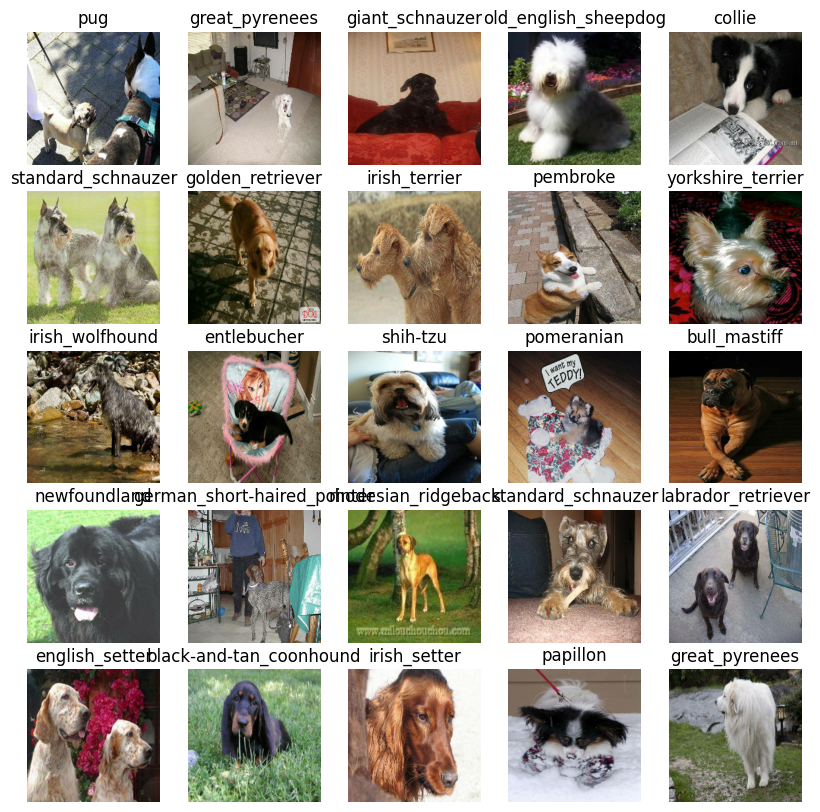

In [50]:
# Now let's visualise the data in a training batch
show_25_img(train_img,train_labels)

In [51]:
#Now let's visualize our validation set
val_img ,val_labels = next(val_data.as_numpy_iterator())
len(val_img),len(val_labels)

(32, 32)

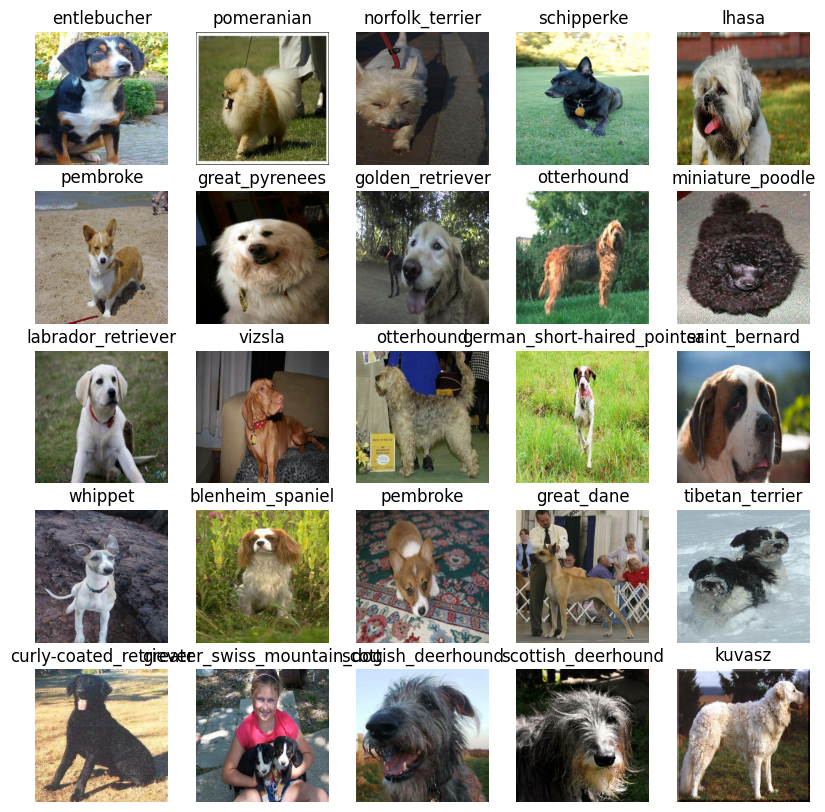

In [52]:
show_25_img(val_img,val_labels)

In [53]:
# Setup input shape of the model

INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3] # Batch ,Height ,Width ,Colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup URL model from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [54]:
# Create a function which builds a keras model
def create_model(input_shape = INPUT_SHAPE,output_shape= OUTPUT_SHAPE,url = MODEL_URL):
    print("Building model with:",url)

    # Setup the model layers
    model = tf.keras.Sequential([
                                 hub.KerasLayer(MODEL_URL),# Layer 1 (input_layer)
                                 tf.keras.layers.Dense(units = OUTPUT_SHAPE
                                                       ,activation = "softmax")# Layer 2(output layer)

    ])

    # Compile the model 
    model.compile(
        loss = tf.keras.losses.CategoricalCrossentropy(),
        optimizer = tf.keras.optimizers.Adam(),
        metrics = ["accuracy"]
    )

    # Build the model
    model.build(INPUT_SHAPE)

    return model

In [55]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [56]:
# Load Tensorboard notebook extensions
%load_ext tensorboard 

In [57]:
import datetime

# Create a fuction to build a Tesorboard Callabck
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard logs
  logdir = os.path.join("/content/drive/My Drive/Dog breed prediction/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)

In [58]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                              patience=3)

In [59]:
NUM_EPOCHS  = 100 #@param {type:"slider",min : 10 ,max :100,steps:10}

In [60]:
print("GPU","available!!" if tf .config.list_physical_devices("GPU") else "not available !!")

GPU available!!


In [61]:
def train_model():
  # Create a model 
  model = create_model()

  # Create new Tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data, 
            epochs = NUM_EPOCHS,
            verbose = 1,
            validation_data = val_data,
            validation_freq = 1,
            callbacks =[tensorboard,early_stop])
  return model

In [62]:
# Fitting the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
250/250 [==============================] - 36s 92ms/step - loss: 1.5031 - accuracy: 0.6413 - val_loss: 0.7247 - val_accuracy: 0.7785
Epoch 2/100
250/250 [==============================] - 23s 94ms/step - loss: 0.4134 - accuracy: 0.8811 - val_loss: 0.6552 - val_accuracy: 0.8005
Epoch 3/100
250/250 [==============================] - 21s 84ms/step - loss: 0.2341 - accuracy: 0.9406 - val_loss: 0.6481 - val_accuracy: 0.8040
Epoch 4/100
250/250 [==============================] - 21s 86ms/step - loss: 0.1442 - accuracy: 0.9718 - val_loss: 0.6637 - val_accuracy: 0.7975
Epoch 5/100
250/250 [==============================] - 20s 79ms/step - loss: 0.1001 - accuracy: 0.9830 - val_loss: 0.6714 - val_accuracy: 0.8005
Epoch 6/100
250/250 [==============================] - 21s 84ms/step - loss: 0.0707 - accuracy: 0.9895 - val_loss: 0.6727 - val_accuracy: 0.8010


In [63]:
%tensorboard --logdir "/content/drive/MyDrive/Dog breed prediction/logs"

<IPython.core.display.Javascript object>

In [64]:
# Prediction on the validation data
preds = model.predict(val_data,verbose=1)
preds

63/63 [==============================] - 6s 88ms/step


array([[1.2769759e-08, 1.0118577e-09, 7.8131306e-09, ..., 1.7458715e-08,
        6.5540931e-08, 6.2672201e-10],
       [2.4001622e-06, 5.6874177e-07, 3.9129347e-08, ..., 9.6343367e-10,
        3.4071732e-08, 9.1719649e-08],
       [7.6948694e-04, 5.2097210e-05, 3.2252973e-04, ..., 3.4918354e-05,
        1.9256458e-04, 9.4856536e-03],
       ...,
       [1.3277447e-04, 8.6582795e-06, 3.2044238e-07, ..., 5.1941210e-05,
        6.6619486e-06, 4.2739203e-03],
       [4.0055298e-07, 1.0912697e-07, 3.0876080e-08, ..., 1.6740178e-06,
        4.2364126e-04, 5.0523414e-07],
       [1.9078803e-07, 1.7743099e-05, 2.9373100e-09, ..., 6.7616877e-09,
        3.6870256e-06, 6.0906755e-06]], dtype=float32)

In [65]:
preds[0]# these values(confidence intervals) are the probabilities values for a single image for a given breed label,the highest value for corresponding label will be taken as breed of that image.

array([1.27697586e-08, 1.01185771e-09, 7.81313059e-09, 1.23859479e-07,
       2.59540030e-07, 1.36717717e-04, 1.77112742e-08, 6.22498783e-06,
       2.46473175e-09, 6.41993847e-06, 1.67196426e-08, 2.71645405e-07,
       5.32452486e-06, 6.13132514e-08, 1.98238865e-08, 3.66720951e-06,
       3.66978057e-08, 4.99805104e-08, 5.84703119e-10, 8.32222380e-09,
       1.32629485e-09, 4.49042803e-09, 2.13727187e-08, 4.43430292e-10,
       4.77877336e-07, 1.37417704e-08, 1.04225996e-10, 1.07859414e-07,
       5.62495828e-09, 3.91768396e-08, 5.60204549e-09, 1.80345392e-08,
       7.60456767e-11, 2.30509456e-09, 6.12280271e-09, 2.16144569e-09,
       1.20859156e-07, 6.83945900e-10, 5.12600273e-08, 5.47597608e-07,
       3.64805386e-09, 8.95075736e-10, 9.99774396e-01, 2.18991914e-07,
       1.00631092e-09, 1.61175884e-09, 1.05776143e-09, 2.08363149e-09,
       2.53382026e-09, 2.73542966e-10, 1.03018127e-08, 1.55281266e-09,
       1.63387726e-09, 3.35189179e-05, 6.99274971e-10, 1.55598940e-07,
      

In [66]:
np.sum(preds[0])

1.0000002

In [67]:
# First Prediction
index = 42
print(preds[index])
print(f"MAX value(probability of prediction):{np.max(preds[index])}")
print(f"Sum :{np.sum(preds[index])}")
print(f"Max index : {np.argmax(preds[index])}")
print(f"Predicted Label : {unique_breeds[np.argmax(preds[index])]}")

[6.73105518e-08 3.42322792e-09 5.28046826e-07 6.84182950e-08
 4.49724325e-07 2.83107215e-06 7.70083886e-07 3.40548553e-07
 1.26263022e-09 2.05850217e-08 2.97576919e-09 1.12702407e-08
 1.69528848e-05 3.55720314e-10 1.85504666e-06 1.04229905e-08
 1.15785440e-06 5.69596992e-08 1.72048100e-08 6.28424687e-07
 1.25548887e-08 4.63144403e-08 4.41879649e-07 2.25028941e-07
 4.37194387e-08 1.50954294e-09 1.31713151e-09 4.52341489e-08
 5.06518960e-09 9.46954242e-06 1.82650173e-09 5.95269967e-09
 3.49552232e-09 7.11299251e-08 1.74315119e-07 4.27057589e-09
 4.99728934e-08 6.35091169e-07 2.07756573e-04 3.44094389e-08
 5.90142069e-09 2.06455630e-09 6.75804079e-09 3.50174673e-06
 3.12877944e-07 8.51127027e-08 2.20428974e-05 2.40483278e-09
 2.28844090e-08 1.78481898e-07 3.29597839e-07 1.10583072e-08
 7.32314609e-09 1.48419019e-06 7.76592060e-06 1.71225918e-06
 1.43238040e-07 1.55061244e-07 3.12111752e-07 4.45255299e-09
 6.98541726e-07 1.16429710e-09 2.96313480e-08 9.98054147e-01
 1.69811216e-07 3.845105

In [68]:
# Turning probabilities into their respective label
def get_preds_label(preds_prob):
  return unique_breeds[np.argmax(preds_prob)]


# Example:
preds_label = get_preds_label(preds[111])
preds_label   

'siberian_husky'

In [69]:
val_data
# in batch form as easy for Tensorflow to process this data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [70]:
def unbatchify(data):
  images_unbatch = []
  labels_unbatch = []

  for img,lbl in data.unbatch().as_numpy_iterator():
    images_unbatch.append(img)
    labels_unbatch.append(unique_breeds[np.argmax(lbl)]) 
  return images_unbatch,labels_unbatch

# unbatch the val_data
val_img,val_labels = unbatchify(val_data)
val_img[0],val_labels[0]

(array([[[0.96884924, 0.9701885 , 0.6773138 ],
         [0.9649684 , 0.9649684 , 0.6752449 ],
         [0.97255224, 0.97255224, 0.6897149 ],
         ...,
         [0.94544876, 0.93533266, 0.63851905],
         [0.9122807 , 0.90027964, 0.59165734],
         [0.6266023 , 0.6167168 , 0.30141547]],
 
        [[0.9636907 , 0.9677085 , 0.69290984],
         [0.97148985, 0.97514886, 0.7090773 ],
         [0.9998248 , 0.99992114, 0.74782914],
         ...,
         [0.97280353, 0.9686894 , 0.715118  ],
         [0.9849285 , 0.99132735, 0.7000457 ],
         [0.8505023 , 0.8618907 , 0.55982476]],
 
        [[0.94763345, 0.9589167 , 0.70516145],
         [0.96966976, 0.9795524 , 0.73575866],
         [0.9953722 , 0.99858195, 0.7804973 ],
         ...,
         [0.8728771 , 0.8872267 , 0.69398195],
         [0.8451019 , 0.8824005 , 0.6274633 ],
         [0.7930096 , 0.83910555, 0.5551244 ]],
 
        ...,
 
        [[0.47171637, 0.37899917, 0.3959688 ],
         [0.23060554, 0.1464493 , 0.15993

In [71]:
get_preds_label(val_labels[0])

'affenpinscher'

In [72]:
def plot_pred(pred_prob,labels,images,n):
  pred_prob, true_label , image = pred_prob[n],labels[n], images[n]

  # Get the pred label
  pred_lbl = get_preds_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])# Empty list so ticks are disabled
  # Ticks are the values used to show specific points on the coordinate axis. It can be a number or a string. Whenever we plot a graph, the axes adjust and take the default ticks. Matplotlib's default ticks are generally sufficient in common situations but are in no way optimal for every plot.


  # Change the colour of the title depending on the nature of prediction.
  if pred_lbl == true_label:
    color = "green"
  else:
    color = "red"  

  # Change plot title
  plt.title("{} {:2.0f}% {}".format(pred_lbl,
                                    np.max(pred_prob)*100,
                                    true_label),
                                     color = color)

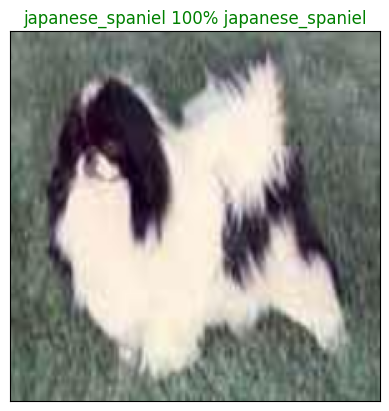

In [73]:
plot_pred(pred_prob=preds,
          labels = val_labels,
          images = val_img,
          n =26)

In [74]:
def plot_pred_confidences(prediction_prob,labels,n):
  pred_prob ,true_label = prediction_prob[n],labels[n]

  # Get the predicted label
  pred_label = get_preds_label(pred_prob)

  # Finding the top 10 prediction confidence indices
  top_10_indx = pred_prob.argsort()[-10:][::-1] # descending order

  # Finding the top 10 preds values
  top_10_preds = pred_prob[top_10_indx]

  # Finding top 10 labels
  top_10_labels = unique_breeds[top_10_indx]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_labels)),
                     top_10_preds,
                     color = "red")
  plt.xticks(np.arange(len(top_10_labels)),
             labels = top_10_labels,
             rotation = "vertical")
  
  # Change color of true label

  if np.isin(true_label ,top_10_labels):
    top_plot[np.argmax(top_10_labels == true_label)].set_color("green")
  else:
    pass

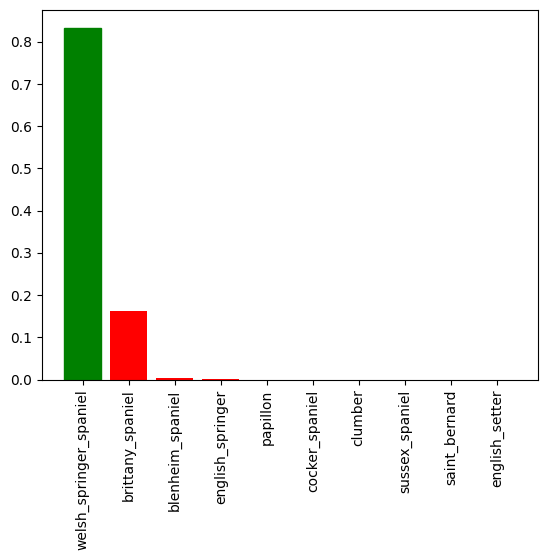

In [75]:
plot_pred_confidences(
      prediction_prob = preds,
      labels = val_labels,
      n = 59
  )

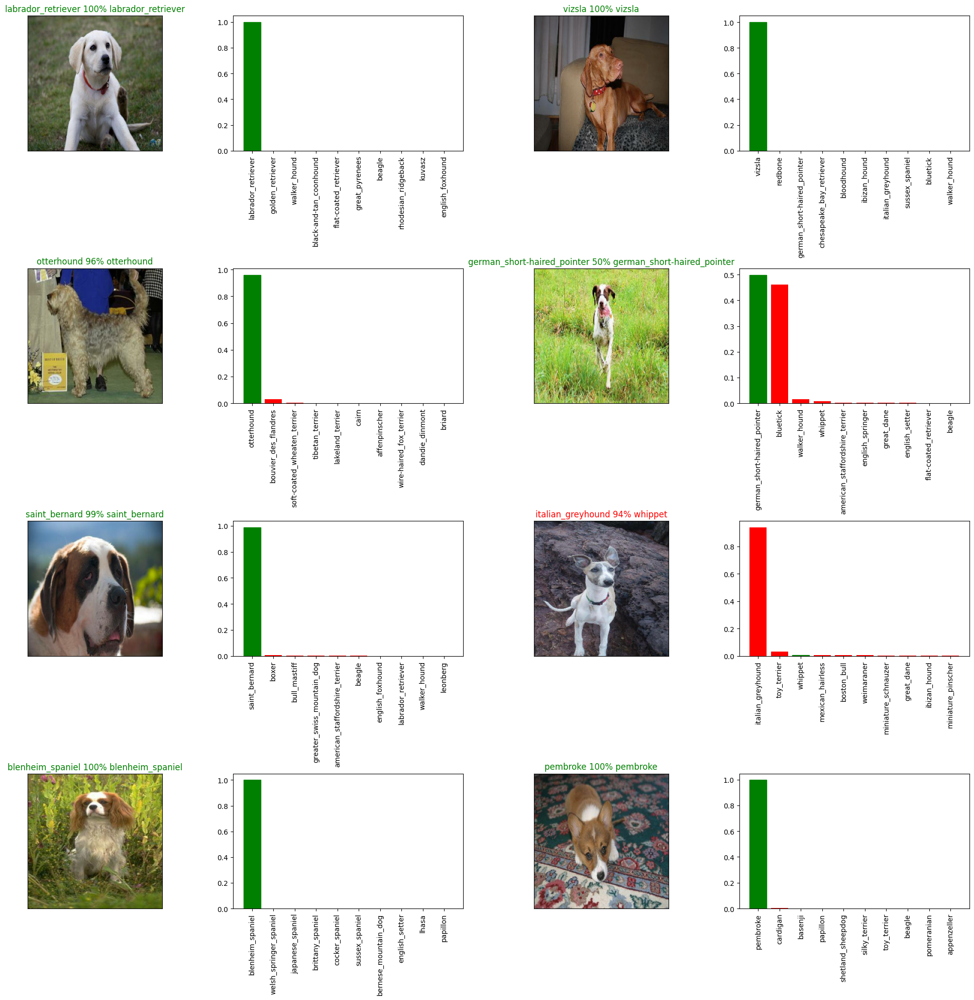

In [76]:
# Visualising the model
i_multiplier = 10
num_rows = 4
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(pred_prob=preds,
            labels = val_labels,
            images = val_img,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols ,2*i+2)
  plot_pred_confidences(prediction_prob=preds,
                        labels = val_labels,
                        n = i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

In [77]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns

In [78]:
# i = 1;
# actual = val_labels[i]
# predicted = get_preds_label(preds[i])
# print(confusion_matrix(actual,predicted))

In [79]:
# function for Saving the model
def save_model(model , suffix = None):
  modeldir = os.path.join("/content/drive/MyDrive/Dog breed prediction/Model",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"saving model : {model_path}")
  model.save(model_path)
  return model_path

In [80]:
# function for Loading the model 
def load_model(model_path):
  print(f"loading saved model from : {model_path}")
  model = tf.keras.models.load_model(model_path,
                                      custom_objects = {"KerasLayer":hub.KerasLayer})
  return model

In [81]:
# Saving our model trained on 1000 images
save_model(model,suffix = "1000-images-mobilenetv2-Adam")

saving model : /content/drive/MyDrive/Dog breed prediction/Model/20230516-22401684276817-1000-images-mobilenetv2-Adam.h5


'/content/drive/MyDrive/Dog breed prediction/Model/20230516-22401684276817-1000-images-mobilenetv2-Adam.h5'

In [83]:
# Loading our trained model
loaded_model = load_model('/content/drive/MyDrive/Dog breed prediction/Model/20230516-22401684276817-1000-images-mobilenetv2-Adam.h5')

loading saved model from : /content/drive/MyDrive/Dog breed prediction/Model/20230516-22401684276817-1000-images-mobilenetv2-Adam.h5


In [84]:
len(x),len(y)

(10222, 10222)

In [85]:
full_data =create_data_batch(x,y)

Creating Training data batches...


In [86]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [87]:
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data,so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience = 3)

In [88]:
# Fitting model with full data

full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 36s 103ms/step - loss: 1.3416 - accuracy: 0.6743
Epoch 2/100
320/320 [==============================] - 22s 68ms/step - loss: 0.4019 - accuracy: 0.8815
Epoch 3/100
320/320 [==============================] - 23s 73ms/step - loss: 0.2404 - accuracy: 0.9348
Epoch 4/100
320/320 [==============================] - 22s 68ms/step - loss: 0.1547 - accuracy: 0.9628
Epoch 5/100
320/320 [==============================] - 22s 68ms/step - loss: 0.1059 - accuracy: 0.9781
Epoch 6/100
320/320 [==============================] - 22s 69ms/step - loss: 0.0798 - accuracy: 0.9851
Epoch 7/100
320/320 [==============================] - 21s 66ms/step - loss: 0.0578 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 22s 67ms/step - loss: 0.0470 - accuracy: 0.9936
Epoch 9/100
320/320 [==============================] - 22s 68ms/step - loss: 0.0358 - accuracy: 0.9967
Epoch 10/100
320/320 [==============================] - 22s 68ms/step - 

In [89]:
save_model(full_model,suffix = "full-image-set-mobilenetv2-Adam")

saving model : /content/drive/MyDrive/Dog breed prediction/Model/20230516-22551684277709-full-image-set-mobilenetv2-Adam.h5


'/content/drive/MyDrive/Dog breed prediction/Model/20230516-22551684277709-full-image-set-mobilenetv2-Adam.h5'

In [90]:
loaded_full_model = load_model("/content/drive/MyDrive/Dog breed prediction/Model/20230516-22551684277709-full-image-set-mobilenetv2-Adam.h5")

loading saved model from : /content/drive/MyDrive/Dog breed prediction/Model/20230516-22551684277709-full-image-set-mobilenetv2-Adam.h5


In [91]:
import pickle
pickle_out = open("doggo.pkl", mode = "wb") 
pickle.dump("/content/drive/MyDrive/Dog breed prediction/Model/20230516-22551684277709-full-image-set-mobilenetv2-Adam.h5", pickle_out) 
pickle_out.close()

In [92]:
# Loading test image filenames
test_path = "dog_dataset/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['dog_dataset/test/7ddf9b454e95b57883f50d511b20c914.jpg',
 'dog_dataset/test/d0fb1d5a18ffd793a5c7ee1e8c7b69f6.jpg',
 'dog_dataset/test/08615ed58e50996f7fb47f039e1a7101.jpg',
 'dog_dataset/test/71a837464ca3f1c810a3a95b6ab0fc86.jpg',
 'dog_dataset/test/f155d5fe889d139892c1d7d46804f419.jpg',
 'dog_dataset/test/2f37bb72a3d8753233fe06cb5d0bb902.jpg',
 'dog_dataset/test/418aa95b6b6c6b37c79f215525e9cef9.jpg',
 'dog_dataset/test/a77d35700ad115836818527dce93460e.jpg',
 'dog_dataset/test/2d46b010d81824d286b1ffcaa7495609.jpg',
 'dog_dataset/test/02113c6c2c25cb7bfe1d743c17a93b0d.jpg']

In [93]:
# Create test Data batch
test_data = create_data_batch(test_filenames,test_data=True)

Creating test data batches...


In [94]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [95]:
# Making prediction on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                       verbose=1)
# Going to take time to train the model

324/324 [==============================] - 25s 76ms/step


In [96]:
# To Convert Preds(numpy array) to csv files (for access later)
np.savetxt("/content/drive/MyDrive/Dog breed prediction/preds_array.csv",test_predictions,delimiter = ",")

In [97]:
# Load preds from csv file
test_preds = np.loadtxt("/content/drive/MyDrive/Dog breed prediction/preds_array.csv",delimiter= ",")

In [98]:
test_predictions[:10]

array([[5.6735403e-06, 1.0148923e-07, 1.6540145e-08, ..., 8.3201757e-09,
        1.8846936e-08, 1.1664735e-08],
       [2.3347337e-05, 1.1806588e-04, 1.2563756e-06, ..., 7.0763866e-07,
        1.7807138e-03, 3.8918456e-06],
       [1.0744743e-10, 2.9492245e-13, 2.1267665e-11, ..., 3.6867401e-12,
        2.2485562e-10, 1.3692259e-07],
       ...,
       [2.9225168e-12, 2.4827859e-10, 9.8321046e-11, ..., 5.5592206e-09,
        4.5714690e-09, 9.9224323e-01],
       [6.6597933e-10, 1.1798792e-13, 9.2987011e-13, ..., 1.1374872e-09,
        2.1966826e-13, 4.4641705e-13],
       [1.6606540e-10, 1.2915619e-09, 8.8509738e-12, ..., 4.7046012e-08,
        3.0712000e-10, 2.9366121e-11]], dtype=float32)

In [99]:
# Making prediction on custom inputs

custom_path = "/content/drive/MyDrive/Dog breed prediction/Custom photos/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [100]:
custom_image_path

['/content/drive/MyDrive/Dog breed prediction/Custom photos/doo4.jpg',
 '/content/drive/MyDrive/Dog breed prediction/Custom photos/dog2.jpg',
 '/content/drive/MyDrive/Dog breed prediction/Custom photos/dog1.jpg',
 '/content/drive/MyDrive/Dog breed prediction/Custom photos/dog3.jpg']

In [101]:
# Turn custom images into batch datasets
custom_data = create_data_batch(custom_image_path,test_data=True)
custom_data 

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [102]:
# MAkig prediction on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 608ms/step


In [103]:
# Getting custom image  prediction labels
custom_preds_labels = [get_preds_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['border_collie', 'border_collie', 'collie', 'english_foxhound']

In [104]:
# Our unbatchify() function won't work since there aren't labels .. 

# Getting custom images
custom_images = []

#loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

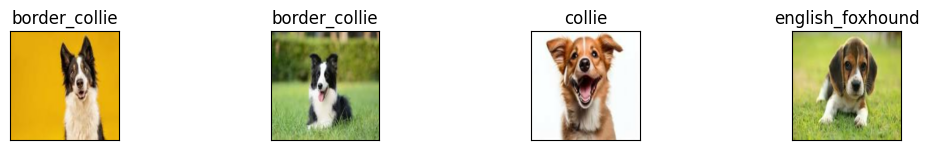

In [105]:
plt.figure(figsize=(30,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,2*9,2*i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)

In [ ]:
# !pip install -q pyngrok

# !pip install -q streamlit

# !pip install -q streamlit_ace

# # !pip install classifier

# !pip install autokeras